In [33]:
from keras_segmentation.models.unet import vgg_unet
from keras_segmentation.pretrained import pspnet_101_cityscapes, pspnet_50_ADE_20K
from keras_segmentation.models.pspnet import pspnet_101, pspnet_50
#from keras_segmentation.models.model_utils import transfer_weights
from tqdm import tqdm

def transfer_weights(m1, m2, verbose=True):

    assert len(m1.layers) == len(
        m2.layers), "Both models should have same number of layers"

    nSet = 0
    nNotSet = 0

    if verbose:
        print("Copying weights ")
        bar = tqdm(zip(m1.layers, m2.layers))
    else:
        bar = zip(m1.layers, m2.layers)

    for l, ll in bar:

        if not any([w.shape != ww.shape for w, ww in zip(list(l.weights),
                                                         list(ll.weights))]):
            if len(list(l.weights)) > 0:
                ll.set_weights(l.get_weights())
                nSet += 1
        else:
            nNotSet += 1

    if verbose:
        print("Copied weights of %d layers and skipped %d layers" %
              (nSet, nNotSet))


pretrained_model = pspnet_50_ADE_20K()

new_model = pspnet_50(n_classes=2)

transfer_weights( pretrained_model , new_model  ) # transfer weights from pre-trained model to your model

new_model.train(
    train_images =  "dataset2/images_prepped_train/",
    train_annotations = "dataset2/annotations_prepped_train/",
    checkpoints_path = "pspnet_checkpoints/pspnet_50" , epochs=500
)

225it [11:14,  3.00s/it]
100%|██████████| 18000/18000 [01:23<00:00, 216.05it/s]


Copying weights 
Copied weights of 120 layers and skipped 1 layers
Verifying train dataset
Dataset verified! 
Starting Epoch  0
Epoch 1/1
512/512 [==============================] - 224s 438ms/step - loss: 0.2344 - acc: 0.8953

RuntimeError: Dirty entry flush destroy failed (file write failed: time = Sat Jan 25 06:54:46 2020
, filename = 'pspnet_checkpoints/pspnet_50.232', file descriptor = 76, errno = 28, error message = 'No space left on device', buf = 0x5568c3280c00, total write size = 4096, bytes this sub-write = 4096, bytes actually written = 18446744073709551615, offset = 6168)

In [ ]:
model = vgg_unet( n_classes=2 ,  input_height=512, input_width=512  )

model.train(
    train_images =  "dataset2/images_prepped_train/",
    train_annotations = "dataset2/annotations_prepped_train/",
    checkpoints_path = "checkpoints/vgg_unet" , epochs=5
)

out = model.predict_segmentation(
    inp="carla.png",
    out_fname="/tmp/out.png"
)

import matplotlib.pyplot as plt
plt.imshow(out)

# evaluating the model
print(model.evaluate_segmentation( inp_images_dir="dataset2/images_prepped_test/"  , annotations_dir="dataset2/annotations_prepped_test/" ) )



In [ ]:
out = model.predict_segmentation(
    inp="../../training/images/-RvUfordKSu3eFmYIBbt_A.jpg",
    out_fname="/tmp/out.png"
)
plt.imshow(out)

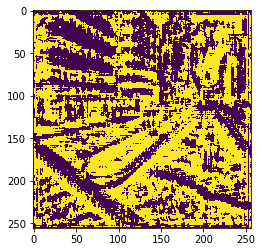

In [16]:
out = model.predict_segmentation(
    inp="carla.png",
    out_fname="eberg_out.png"
)
plt.imshow(out)

In [ ]:
from keras_segmentation.predict import model_from_checkpoint_path
checkpoint = model_from_checkpoint_path("pspnet_checkpoints/pspnet_50")
out = checkpoint.predict_segmentation(
    inp="eberg.jpg",
    out_fname="eberg_pspnet50.png"
)
#plt.imshow(out)